## Exploratory Data Analysis 

## Problem Statement

1. We have 100 hypothetical Customer Transaction of 3 months
2. We are require to analyse the dataset and gather the insights from the dataset.
3. We have to find overall insight For example -- what is the average transaction amount? How many transactions do customers make each month, on average? 
4. We'll segment the data into date and time.
5. Do the visualization
6. Check any outliers.
7. Answer many more questions from the analysis 

In [7]:
#Importing the required Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [8]:
#loading the dataset

df = pd.read_csv("ANZ.csv")

In [9]:
df.head()

,status,card_present_flag,bpay_biller_code,account,currency,long_lat,txn_description,merchant_id,merchant_code,first_name,...,age,merchant_suburb,merchant_state,extraction,amount,transaction_id,country,customer_id,merchant_long_lat,movement
0,authorized,1.0,NaN,ACC-1598451071,AUD,153.41 -27.95,POS,81c48296-73be-44a7-befa-d053f48ce7cd,NaN,Diana,...,26,Ashmore,QLD,2018-08-01T01:01:15.000+0000,16.25,a623070bfead4541a6b0fff8a09e706c,Australia,CUS-2487424745,153.38 -27.99,debit
1,authorized,0.0,NaN,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,830a451c-316e-4a6a-bf25-e37caedca49e,NaN,Diana,...,26,Sydney,NSW,2018-08-01T01:13:45.000+0000,14.19,13270a2a902145da9db4c951e04b51b9,Australia,CUS-2487424745,151.21 -33.87,debit
2,authorized,1.0,NaN,ACC-1222300524,AUD,151.23 -33.94,POS,835c231d-8cdf-4e96-859d-e9d571760cf0,NaN,Michael,...,38,Sydney,NSW,2018-08-01T01:26:15.000+0000,6.42,feb79e7ecd7048a5a36ec889d1a94270,Australia,CUS-2142601169,151.21 -33.87,debit
3,authorized,1.0,NaN,ACC-1037050564,AUD,153.10 -27.66,SALES-POS,48514682-c78a-4a88-b0da-2d6302e64673,NaN,Rhonda,...,40,Buderim,QLD,2018-08-01T01:38:45.000+0000,40.90,2698170da3704fd981b15e64a006079e,Australia,CUS-1614226872,153.05 -26.68,debit
4,authorized,1.0,NaN,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,b4e02c10-0852-4273-b8fd-7b3395e32eb0,NaN,Diana,...,26,Mermaid Beach,QLD,2018-08-01T01:51:15.000+0000,3.25,329adf79878c4cf0aeb4188b4691c266,Australia,CUS-2487424745,153.44 -28.06,debit


In [12]:
df.shape

(12043, 23)

### We can see that there are 12043 rows and 23 columns in our dataset

In [13]:
df.describe()

,card_present_flag,merchant_code,balance,age,amount
count,7717.000000,883.0,12043.000000,12043.000000,12043.000000
mean,0.802644,0.0,14704.195553,30.582330,187.933588
std,0.398029,0.0,31503.722652,10.046343,592.599934
min,0.000000,0.0,0.240000,18.000000,0.100000
25%,1.000000,0.0,3158.585000,22.000000,16.000000
50%,1.000000,0.0,6432.010000,28.000000,29.000000
75%,1.000000,0.0,12465.945000,38.000000,53.655000
max,1.000000,0.0,267128.520000,78.000000,8835.980000


## From the above summary of data we can analyse that:

1. Mean age of the customer is 30
2. Minimum age of the customer is 18 whereas maximum age of the customer is 78
3. Maximum amount of transaction is 8836 and minimum transaction is 0

In [14]:
#Lets check the null values in the dataset

df.isnull().sum()

status                   0
card_present_flag     4326
bpay_biller_code     11158
account                  0
currency                 0
long_lat                 0
txn_description          0
merchant_id           4326
merchant_code        11160
first_name               0
balance                  0
date                     0
gender                   0
age                      0
merchant_suburb       4326
merchant_state        4326
extraction               0
amount                   0
transaction_id           0
country                  0
customer_id              0
merchant_long_lat     4326
movement                 0
dtype: int64

In [19]:
percent_of_null_card_present_flag = 4326/12043
print('Percent of null values in card present:', percent_of_null_card_present_flag)
percent_of_bpay_biller_code = 11158/12043
print('Percent of null values in Bpay biller code:', percent_of_bpay_biller_code)

Percent of null values in card present: 0.3592128207257328
Percent of null values in Bpay biller code: 0.9265133272440422


### I would like to put some light on what is Card present Flag, it is the flag raised by bank when it appears that some else other than card owner is trying to do some transactions.

### And Bpay biller code is used by banks to identify where the money is being sent.

### Here, we can see that 35% of the data is missing from card present flag so we can keep this data and can do its treatment where as 93% of the data is missing from Bpay biller code and merchant code, in this case we can drop these columns.

In [21]:
#Dropping bpay_biller_code and merchant_code 

df.drop(df[['bpay_biller_code', 'merchant_code']], axis=1, inplace = True)

In [24]:
df.shape

(12043, 21)

### We'll now perform Univariate and Bivariate Analysis with the help of Data Visualization.

### lets divide the dataset into Categorical,  Ordinal features and Numerical features 

### Categorical Features are:
1. status
2. currency
3. txn_description
4. first_name
5. country
6. movement
7. merchant_suburb
8. merchant_state

### Ordinal Features
1. card_present_flag

### Numerical Features are: 
1. long_lat
2. balance
3. age
4. amount
5. merchant_long_lat

### Mixed features (the one with alphanumerical values)
1. account
2. merchant_id
3. transaction_id
4. customer_id

### Date Features
1. date
2. extraction

## Data Visualization

### Categorical Features

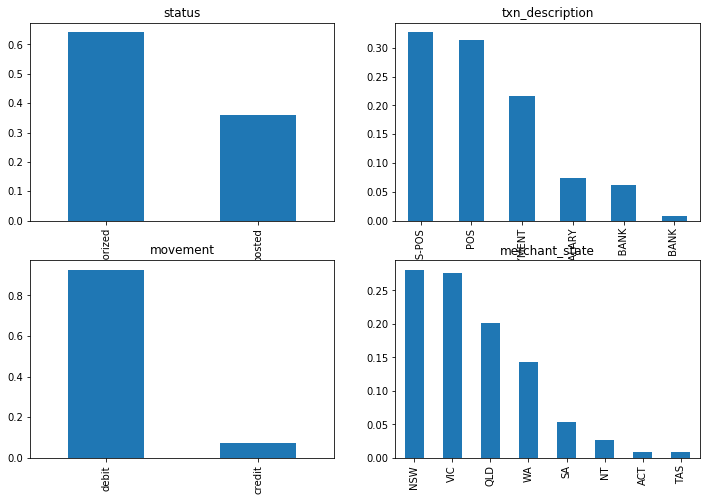

In [49]:
plt.figure(1)
plt.subplot(221)
df['status'].value_counts(normalize = True ).plot.bar(figsize = (12,8), title = 'status')
plt.subplot(222)
df['txn_description'].value_counts(normalize = True).plot.bar(figsize = (12,8), title = 'txn_description')
plt.subplot(223)
df['movement'].value_counts(normalize = True).plot.bar(figsize = (12,8), title = 'movement')
plt.subplot(224)
df['merchant_state'].value_counts(normalize = True).plot.bar(figsize = (12,8), title = 'merchant_state')
plt.show()

### From the above visualization we can analyse that:
1. More than 60% of the status is authorized and around 35% is posted
2. More than 80% of the transaction is debted
3. NSW is the highest state with merchants that means largest no of transactions took place from NSW followed by VIC then QLD and so on..

 ### Ordinal feature

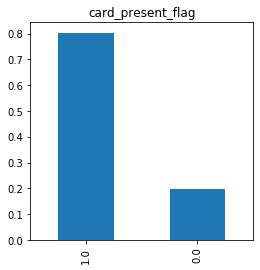

In [55]:
df['card_present_flag'].value_counts(normalize = True).plot.bar(figsize = (4,4), title = 'card_present_flag')

### We can see that approximately 80% of the cards got flagged by the bank

### Numerical Features

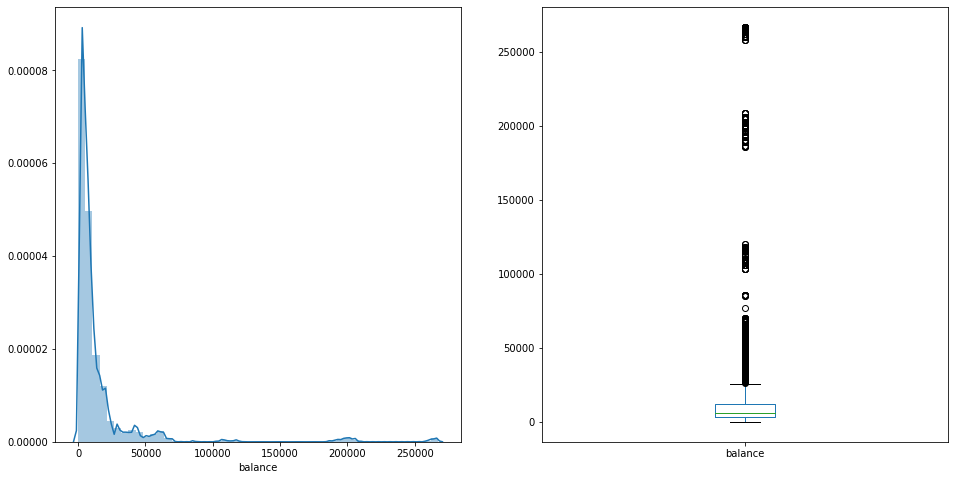

In [57]:
plt.figure(1)
plt.subplot(121)
sns.distplot(df['balance'])
plt.subplot(122)
df['balance'].plot.box(figsize = (16,8))
plt.show()

### from the above graph we can analyse that the more of the balance is clustered towards the left, hence the data is right sekwed. We can also see that the data is not normally distributed. 
### Looking in the boxplot we can analyse that there are outliers. 

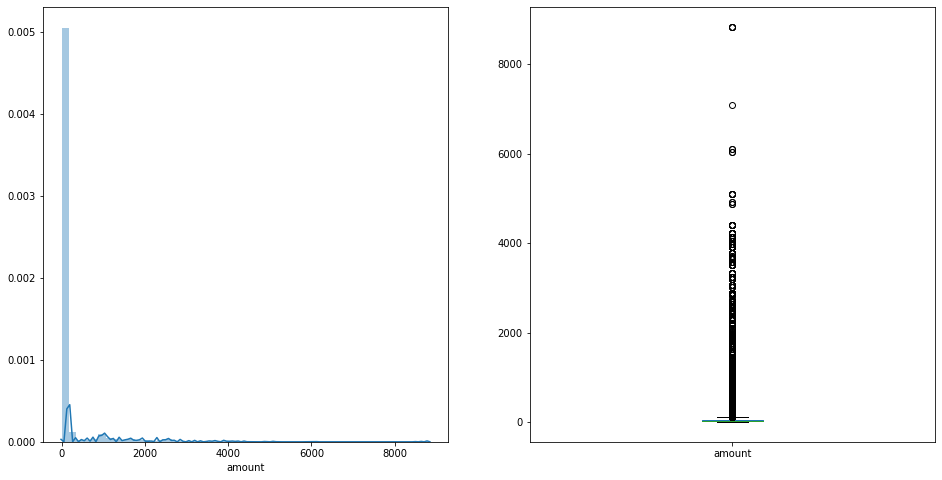

In [58]:
plt.figure(1)
plt.subplot(121)
sns.distplot(df['amount'])
plt.subplot(122)
df['amount'].plot.box(figsize = (16, 8))
plt.show()

### We can see that the data has an outlier and it is also not normally distributed. The data is right skewed.

## Visualizing latitude and longitude

In [60]:
#Representtaion of latitude and longitude data on map

lat = []
lon = []

#Segregating the longitude and latitude

for a in df['long_lat']:
    try: 
        lon.append(a.split(' ')[0])
        lat.append(a.split(' ')[1])
    except:
        lon.append(np.NaN)
        lat.append(np.NaN)

#Creating new columns and assigning the value of lat and log to these columns
        
df['latitude'] = lat
df['longitude'] = lon   

In [61]:
df['latitude'].head()

0    -27.95
1    -27.95
2    -33.94
3    -27.66
4    -27.95
Name: latitude, dtype: object

In [62]:
df['longitude'].head()

0    153.41
1    153.41
2    151.23
3    153.10
4    153.41
Name: longitude, dtype: object

In [65]:
#Converting the values to numeric 

df['latitude']=pd.to_numeric(df['latitude'])
df['longitude']=pd.to_numeric(df['longitude'])

In [70]:
df[['latitude','longitude']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12043 entries, 0 to 12042
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   latitude   12043 non-null  float64
 1   longitude  12043 non-null  float64
dtypes: float64(2)
memory usage: 188.3 KB


### We can see that we have converted dataype from object to numeric

In [84]:
#Importing library

import math
!pip install folium
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

In [85]:
map = folium.Map(location=['-25.2744','133.7751'],tiles='cartodbpositron',zoom_start=5)

In [89]:
mc = MarkerCluster()
for idx, row in df.iterrows():
    if not math.isnan(row['longitude']) and not math.isnan(row['latitude']):
        mc.add_child(Marker([row['latitude'], row['longitude']]))
map.add_child(mc)

map

### from the above map we can see that large number of transaction took place from Sydney, Brisban, Perth and melbourne.

## Bivariate Analysis

### Month wise Analysis


In [97]:
#Converting date to pandas timestamp

df['date'] = pd.to_datetime(df['date'])

#extract the day and month

df['day_name'] = df['date'].dt.day_name()
df['day_name'].head()

0    Wednesday
1    Wednesday
2    Wednesday
3    Wednesday
4    Wednesday
Name: day_name, dtype: object

In [99]:
df['month_name'] = df['date'].dt.month_name()
df['month_name'].head()

0    August
1    August
2    August
3    August
4    August
Name: month_name, dtype: object

In [100]:
#month generated

df['month_name'].value_counts()

October      4087
September    4013
August       3943
Name: month_name, dtype: int64

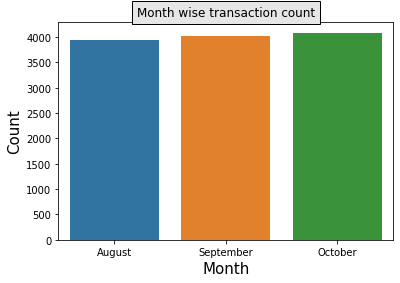

In [102]:
#displaying monthwise transaction

plt.figure()
plt.title("Month wise transaction count",bbox={'facecolor':'0.9', 'pad':5})
sns.countplot(x='month_name', data=df)
plt.ylabel("Count",fontsize=15)
plt.xlabel("Month",fontsize=15)
plt.show()

####  October has the highest no. of transactions

Text(0.5, 1.0, 'Percentage of contribution from each months')

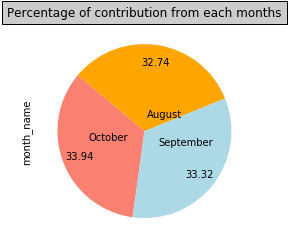

In [107]:
#Visualize percentage of contribution each month

pie = ['salmon', 'lightblue', 'orange']
plt.subplot()
df['month_name'].value_counts(sort = True).plot.pie(labeldistance=0.2 ,
                                         colors=pie,
                                        autopct='%.2f', startangle=140,pctdistance=0.8 , radius=1)
plt.title("Percentage of contribution from each months", bbox={'facecolor':'0.8', 'pad':5})

In [123]:
# Month wise transaction amount

month_amount = df.groupby(['month_name']).amount.sum().sort_values(ascending = False)
month_amount

month_name
October      802798.47
September    730550.21
August       729935.52
Name: amount, dtype: float64

Text(0.5, 1.0, 'Month wise amount')

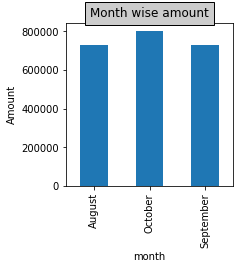

In [139]:
#Visualizing month wise amount 

plt.figure(figsize = (3,3))
df.groupby('month_name').amount.sum().plot(kind='bar')
plt.xlabel('month')
plt.ylabel('Amount')
plt.title("Month wise amount", bbox={'facecolor':'0.8', 'pad':5})

In [143]:
#Calculating avg transaction amount each month

month_grp = df.groupby('month_name')
avg_amt_trans_month = month_grp['amount'].mean()
avg_amt_trans_month

month_name
August       185.121867
October      196.427323
September    182.045903
Name: amount, dtype: float64

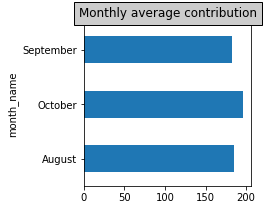

In [144]:
#Visualizing avg transaction amount each month

plt.figure(figsize = (3,3))
avg_amt_trans_month.plot.barh(x = 'month', y='monthly_avg_amount')
plt.title("Monthly average contribution", bbox={'facecolor':'0.8', 'pad':5})
plt.show()

#### We can see from above analysis that overall October has the largest transactions, its has highest avg monthly contribution. Now, explore more on October transactions.

In [145]:
# no. of times each amount transacted

oct_amt_tran_month = month_grp['amount'].value_counts().loc['October']
oct_amt_tran_month

amount
33.00      58
39.00      43
29.00      42
36.00      39
20.00      35
           ..
4094.33     1
4863.62     1
4910.90     1
6107.23     1
7081.09     1
Name: amount, Length: 2288, dtype: int64

In [148]:
#Date wise no. of transactions in october

oct_date = month_grp['date'].value_counts().loc['October']
oct_date.head()

date
2018-10-05    168
2018-10-17    162
2018-10-03    160
2018-10-04    159
2018-10-19    158
Name: date, dtype: int64

In [158]:
#Amount transacted in month of October

filt = (df['month_name'] == 'October')
df.loc[filt, 'amount'].sum()

7956      29.57
7957       8.44
7958     163.00
7959      10.65
7960      33.00
          ...  
12038      9.79
12039     63.87
12040     43.96
12041     30.77
12042     22.36
Name: amount, Length: 4087, dtype: float64

In [164]:
# Average amount in month of October
print('Average amount in month of October:', df.loc[filt, 'amount'].mean())

#Maximum amount transacted in october
print('Maximum amount transacted in october:', df.loc[filt, 'amount'].max())

#Minimum amount transacted in october
print('Minimum amount transacted in october:', df.loc[filt, 'amount'].min())

Average amount in month of October: 196.42732321996542
Maximum amount transacted in october: 8835.98
Minimum amount transacted in october: 0.1


### Gender wise transaction Analysis

In [167]:
#Gender wise transaction count

gen = df.groupby('gender').gender.count()
gencs = gen.sort_values(ascending = False)
gencs

gender
M    6285
F    5758
Name: gender, dtype: int64

Text(0.5, 0, 'Gender')

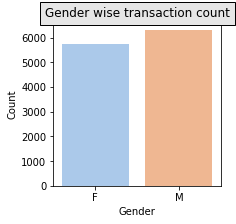

In [171]:
# Visualizing geder wise transaction amount

plt.figure(figsize = (3,3))
ax = sns.countplot(x = 'gender', data = df, palette = 'pastel')
ax.set_title(label = 'Gender wise transaction count',bbox={'facecolor':'0.9', 'pad':5})
ax.set_ylabel(ylabel = 'Count')
ax.set_xlabel(xlabel = 'Gender')

#### We can see that male transactions are higher

Text(0.5, 1.0, 'Percentage of contribution from gender')

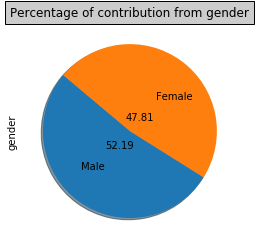

In [172]:
# Percentage of contribution from each gender

plt.subplot()
df['gender'].value_counts().plot.pie(autopct='%.2f',labels=['Male',
                                                                         'Female'], labeldistance=0.5 ,
                                                   shadow=True, startangle=140,pctdistance=0.2 , radius=1)
plt.title('Percentage of contribution from gender' , bbox={'facecolor':'0.8', 'pad':5})

In [173]:
#Gender wise transaction amount

gen_amt = df.groupby(['gender']).amount.agg([sum]) 
gen_amt

,sum
gender,
F,970322.63
M,1292961.57


In [174]:
# average transaction amount by gender 

gender_grp = df.groupby(['gender'])
gen_trans_amt = gender_grp['amount'].mean()
gen_trans_amt

gender
F    168.517303
M    205.721809
Name: amount, dtype: float64

In [180]:
# total transaction amount by gender 

gender_total_amt = gender_grp['amount'].sum()
gender_total_amt

gender
F     970322.63
M    1292961.57
Name: amount, dtype: float64

Text(0.5, 0, 'Amount')

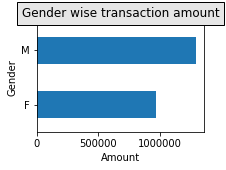

In [184]:
# visualize gender wise transaction amount

fig,ax = plt.subplots(figsize=(3,2))
gender_total_amt.plot.barh()
plt.title("Gender wise transaction amount",bbox={'facecolor':'0.9', 'pad':5})
plt.ylabel("Gender")
plt.xlabel("Amount")

Text(0.5, 0, 'Amount')

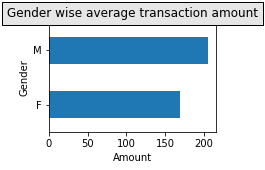

In [186]:
fig,ax = plt.subplots(figsize=(3,2))
gen_trans_amt.plot.barh()
plt.title("Gender wise average transaction amount",bbox={'facecolor':'0.9', 'pad':5})
plt.ylabel("Gender")
plt.xlabel("Amount")
